In [1]:
import pandas as pd 
import pandas_profiling 
import numpy as np 
import seaborn as np 
import seaborn as sns 
from datatime import date 
import re 
from sklearn.preprocessing import LabelEncoder

ModuleNotFoundError: No module named 'datatime'

In [ ]:
import pandas as pd 
import pandas_profiling 
import numpy as np 
import seaborn as np 
import seaborn as sns 
from datatime import date 
import re 
from sklearn.preprocessing import LabelEncoder

df = pd.read_csv("///Users/lucrezialamanna/Desktop/churn_dataset_all.csv")
df["Start Date of Order"] = pd.to_datetime(df["Start Date of Order"], format='%d/%m/%Y')
df["End Date of Order"] = pd.to_datetime(df["End Date of Order"], format='%d/%m/%Y')
df["Previous End Date of Service"] = pd.to_datetime(df["Previous End Date of Service"], format='%d/%m/%Y')
df["Previous Start Date of Service"] = pd.to_datetime(df["Previous Start Date of Service"], format='%d/%m/%Y')
df.shape
#df.dtype

In [266]:
pandas_profiling.ProfileReport(df)

In [3]:
df = df.drop(columns={"Order Detail: ID"}, axis=1)
#df = df.dropna(thresh = 13)
df.isnull().sum()

Pyro Code                                  312
Account Name                                 0
New or Renewal?                              0
Outcome                                      1
Subjects                                  5113
Start Date of Order                        994
End Date of Order                          994
Previous Start Date of Service            2553
Previous End Date of Service              2553
Value of this Product                        4
Additional Incentives                     3896
Additional Incentives Value               4000
Free Months Given                         3377
Price Based on This Number of Students    2071
Grade                                     3463
Upgrade, Downgrade, or Stayed the Same    3546
Check-up Category                         3565
Intervention Category                     4191
Closed Lost Reason                        4769
Project Manager                           4262
Sector                                       0
dtype: int64

In [4]:
df = df.sort_values(["Pyro Code"])
df["Subjects"].fillna("All", inplace=True)
df.head(10)

,Pyro Code,Account Name,New or Renewal?,Outcome,Subjects,Start Date of Order,End Date of Order,Previous Start Date of Service,Previous End Date of Service,Value of this Product,...,Additional Incentives Value,Free Months Given,Price Based on This Number of Students,Grade,"Upgrade, Downgrade, or Stayed the Same",Check-up Category,Intervention Category,Closed Lost Reason,Project Manager,Sector
0,1016.0,Bedford School,New,Closed Won,All,2010-04-30,2011-06-30,NaT,NaT,1250.00,...,1250.00,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3. Independent
1,1016.0,Bedford School,Renewal,Closed Won,All,2011-07-01,2012-06-30,2010-04-30,2011-06-30,1500.00,...,250.00,NaN,NaN,NaN,Downgrade,NaN,NaN,NaN,NaN,3. Independent
2,1016.0,Bedford School,Renewal,Closed Won,All,2012-08-01,2013-08-31,2011-01-07,2012-06-30,1500.00,...,250.00,NaN,NaN,NaN,Downgrade,NaN,NaN,NaN,NaN,3. Independent
3,1016.0,Bedford School,Renewal,Closed Won,All,2017-12-01,2019-11-30,2016-01-12,2017-11-30,5000.00,...,57.08,NaN,290.0,F,Upgrade,AWAITING RENEWAL DISCUSSION,NEEDS PRIORITISATION (Medium or Low) - End,NaN,NaN,3. Independent
4,1016.0,Bedford School,Renewal,Closed Won,All,2015-11-01,2016-11-30,2014-01-10,2015-10-31,2150.00,...,650.00,1.0,280.0,NaN,Downgrade,NaN,NaN,NaN,NaN,3. Independent
5,1016.0,Bedford School,Renewal,Closed Won,All,2016-12-01,2017-11-30,2015-01-11,2016-11-30,2660.00,...,NaN,NaN,280.0,F,Downgrade,PROJECT MANAGER RESPONSIBLE (-),Previously in intervention,NaN,NaN,3. Independent
6,1016.0,Bedford School,Renewal,Closed Won,All,2013-08-01,2014-09-30,2012-01-08,2013-08-31,2150.00,...,559.00,NaN,NaN,NaN,Downgrade,NaN,NaN,NaN,NaN,3. Independent
7,1016.0,Bedford School,Renewal,Closed Won,All,2014-10-01,2015-10-31,2013-01-08,2014-09-30,2150.00,...,567.00,NaN,280.0,NaN,Downgrade,NaN,NaN,NaN,NaN,3. Independent
8,1016.0,Bedford School,Renewal,Closed Won,All,2019-12-01,2021-11-30,2017-12-01,2019-11-30,5000.00,...,781.51,NaN,294.0,E,Upgrade,PROJECT MANAGER RESPONSIBLE (-),Previously in intervention,NaN,Kate Storey,3. Independent
15,1023.0,Essa Academy,Renewal,Closed Won,All,2017-01-01,2018-12-31,2015-01-01,2016-12-31,3577.44,...,1651.76,NaN,340.0,E,Downgrade,MISSING LEAD - HEAD LETTER SENT,NEEDS PRIORITISATION (Medium or Low) - Midpoint,NaN,NaN,1. Academy


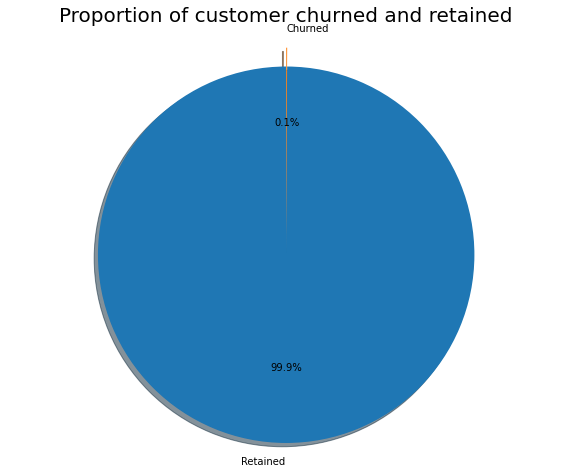

In [268]:
# le = LabelEncoder()
# df['Account Name'] = le.fit_transform(df['Account Name'])
import matplotlib.pyplot as plt
labels = 'Retained', 'Churned'
sizes = [df_future.Outcome[df_future['Outcome']=="Closed Won"].count(), df_future.Outcome[df_future['Outcome']=="Closed Lost"].count()]
explode = (0, 0.1)
fig1, ax1 = plt.subplots(figsize=(10, 8))
ax1.pie(sizes, explode=explode, labels=labels, autopct='%1.1f%%',
        shadow=True, startangle=90)
ax1.axis('equal')
plt.title("Proportion of customer churned and retained", size = 20)
plt.show()

In [337]:
# df.head(20)
# df.to_csv('///Users/lucrezialamanna/Desktop/churn_dataset_farah.csv')
df_last_3 = df[(df['Year End'] >= 2017)]

In [331]:
#Drop rows with Nan Pyro Codes
df = df[df['Pyro Code'].notna()]
df = df[df['New or Renewal?']=='Renewal']

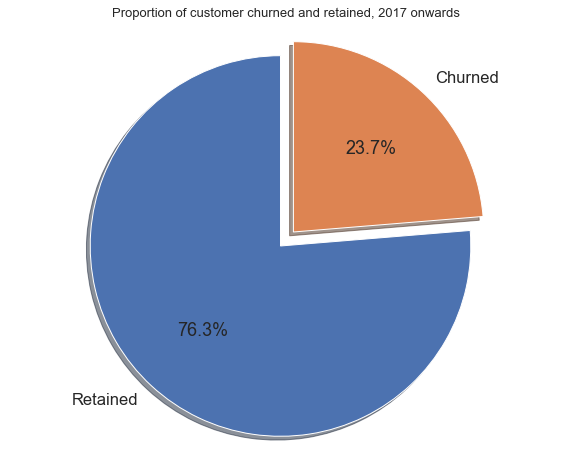

In [338]:
import matplotlib.pyplot as plt
labels = 'Retained', 'Churned'
sizes = [df_last_3.Outcome[df_last_3['Outcome']=="Closed Won"].count(), df_last_3.Outcome[df_last_3['Outcome']=="Closed Lost"].count()]
explode = (0, 0.1)
fig1, ax1 = plt.subplots(figsize=(10, 8))
ax1.pie(sizes, explode=explode, labels=labels, autopct='%1.1f%%',
        shadow=True, startangle=90)
ax1.axis('equal')
plt.title("Proportion of customer churned and retained, 2017 onwards", size = 13)
plt.show()

In [334]:
df_last_3.groupby(["Sector", "Outcome"]).size()

Sector                            Outcome    
1. Academy                        Closed Lost    166
                                  Closed Won     722
10. FE/Adult Training             Closed Lost     14
                                  Closed Won      14
11. 6th Form College              Closed Lost      3
                                  Closed Won       2
14. Government                    Closed Won       1
15. Individuals                   Closed Lost      1
2. State                          Closed Lost    114
                                  Closed Won     382
20. Unknown/Other                 Closed Lost      1
                                  Closed Won       1
3. Independent                    Closed Lost     36
                                  Closed Won     212
4. UTC/CTC                        Closed Lost      4
                                  Closed Won       6
5. Special/Alternative Provision  Closed Lost      7
                                  Closed Won      13


In [7]:
df.describe()

,Pyro Code,Value of this Product,Additional Incentives Value,Free Months Given,Price Based on This Number of Students
count,5091.000000,5399.000000,1403.000000,2026.000000,3332.000000
mean,4626.255942,3966.300856,669.075545,5.368707,297.229892
std,2489.900936,2986.811729,1012.725250,3.862423,192.854219
min,1016.000000,0.000000,0.000000,0.000000,0.000000
25%,2280.000000,1808.960000,167.915000,3.000000,180.000000
50%,4320.000000,3277.500000,361.460000,4.000000,300.000000
75%,6581.000000,5400.000000,840.000000,7.000000,395.000000
max,9447.000000,35200.000000,17700.000000,24.000000,3500.000000


In [259]:
#Get the number of customers that churned
df_before_last_3['Outcome'].value_counts()

Closed Won     798
Closed Lost    363
Name: Outcome, dtype: int64

/Users/lucrezialamanna/anaconda3/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


<AxesSubplot:xlabel='Outcome', ylabel='count'>

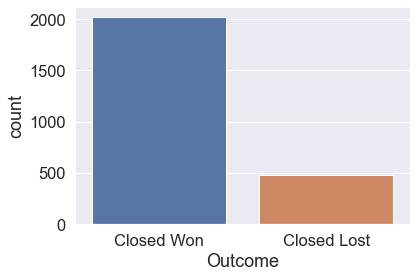

In [311]:
sns.countplot(df_last_3['Outcome'])

In [10]:
#What percentage of customers are leaving ?
retained = df[df.Outcome == 'Closed Won']
churned = df[df.Outcome == 'Closed Lost']
num_retained = retained.shape[0]
num_churned = churned.shape[0]
#Print the percentage of customers that stayed and left
print( num_retained / (num_retained + num_churned) * 100 , "% of customers stayed with the company.")
#Print the percentage of customers that stayed and left
print( num_churned / (num_retained + num_churned) * 100,"% of customers left the company.")

81.4142910033321 % of customers stayed with the company.
18.5857089966679 % of customers left the company.


In [84]:
#Churning by sector
import matplotlib.pyplot as plt
%matplotlib inline

plt.figure(figsize=(406,300))
b = sns.countplot(x="Sector", hue="Outcome", data=df)
b.axes.set_title("Outcome by sector",fontsize=200)
b.set_xlabel("Sector",fontsize=120)
b.set_ylabel("Churn outcome count",fontsize=120)
b.tick_params(labelsize=100)
plt.show()


In [85]:
df.dtypes

Pyro Code                                        float64
Account Name                                      object
New or Renewal?                                   object
Outcome                                           object
Subjects                                          object
Start Date of Order                       datetime64[ns]
End Date of Order                         datetime64[ns]
Previous Start Date of Service            datetime64[ns]
Previous End Date of Service              datetime64[ns]
Value of this Product                            float64
Additional Incentives                             object
Additional Incentives Value                      float64
Free Months Given                                float64
Price Based on This Number of Students           float64
Grade                                             object
Upgrade, Downgrade, or Stayed the Same            object
Check-up Category                                 object
Intervention Category          

In [309]:
df["Year Start"] = df["Start Date of Order"].dt.year.fillna(df["Previous Start Date of Service"].dt.year)
df["Year End"] = df["End Date of Order"].dt.year.fillna(df["Previous End Date of Service"].dt.year)
df["Year End"] = df["Year End"].astype('Int64')
df = df[df['Year End'].notna()]
df_now = df[(df['Year End'] <= 2020)]
df_last_3 = df[(df['Year End'] <= 2020) & (df['Year End'] >= 2017)]
df_future = df[df["Year End"] > 2020]
df_last_3.groupby(["Year End", "Outcome"]).size()
#df[df["Outcome"]=="Closed Lost"]
#df_future.shape
#df_future["Outcome"].unique()
#df_future[df_future.Outcome.isna()]

Year End  Outcome    
2017      Closed Lost    113
          Closed Won     337
2018      Closed Lost    117
          Closed Won     465
2019      Closed Lost    166
          Closed Won     553
2020      Closed Lost     80
          Closed Won     664
dtype: int64

In [ ]:
#Visualize the churn count per year
plt.figure(figsize=(60,40))
c = sns.countplot(x="Year End", hue="Outcome", data=df)
c.axes.set_title("Outcome by year",fontsize=80)
c.set_xlabel("Date",fontsize=60)
c.set_ylabel("Churn outcome count",fontsize=60)
c.tick_params(labelsize=40)
plt.show()

In [12]:
#See how many subscriptions ending each year to see why the increase in churning 2019
#df_now["Year"].value_counts()
df["Subscription length"] = (df_now["Year End"] - df_now["Year Start"]).astype(int)

df_future["Year End"].value_counts()
df_now["Subscription length"] = df_now["Year End"] - df_now["Year Start"]
df_future["Subscription length"] = df_future["Year End"] - df_future["Year Start"]
df.head(30)

/Users/lucrezialamanna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/Users/lucrezialamanna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  import sys


,Pyro Code,Account Name,New or Renewal?,Outcome,Subjects,Start Date of Order,End Date of Order,Previous Start Date of Service,Previous End Date of Service,Value of this Product,...,Grade,"Upgrade, Downgrade, or Stayed the Same",Check-up Category,Intervention Category,Closed Lost Reason,Project Manager,Sector,Year Start,Year End,Subscription length
0,1016.0,Bedford School,New,Closed Won,All,2010-04-30,2011-06-30,NaT,NaT,1250.00,...,NaN,NaN,NaN,NaN,NaN,NaN,3. Independent,2010.0,2011,1.0
1,1016.0,Bedford School,Renewal,Closed Won,All,2011-07-01,2012-06-30,2010-04-30,2011-06-30,1500.00,...,NaN,Downgrade,NaN,NaN,NaN,NaN,3. Independent,2011.0,2012,1.0
2,1016.0,Bedford School,Renewal,Closed Won,All,2012-08-01,2013-08-31,2011-01-07,2012-06-30,1500.00,...,NaN,Downgrade,NaN,NaN,NaN,NaN,3. Independent,2012.0,2013,1.0
3,1016.0,Bedford School,Renewal,Closed Won,All,2017-12-01,2019-11-30,2016-01-12,2017-11-30,5000.00,...,F,Upgrade,AWAITING RENEWAL DISCUSSION,NEEDS PRIORITISATION (Medium or Low) - End,NaN,NaN,3. Independent,2017.0,2019,2.0
4,1016.0,Bedford School,Renewal,Closed Won,All,2015-11-01,2016-11-30,2014-01-10,2015-10-31,2150.00,...,NaN,Downgrade,NaN,NaN,NaN,NaN,3. Independent,2015.0,2016,1.0
5,1016.0,Bedford School,Renewal,Closed Won,All,2016-12-01,2017-11-30,2015-01-11,2016-11-30,2660.00,...,F,Downgrade,PROJECT MANAGER RESPONSIBLE (-),Previously in intervention,NaN,NaN,3. Independent,2016.0,2017,1.0
6,1016.0,Bedford School,Renewal,Closed Won,All,2013-08-01,2014-09-30,2012-01-08,2013-08-31,2150.00,...,NaN,Downgrade,NaN,NaN,NaN,NaN,3. Independent,2013.0,2014,1.0
7,1016.0,Bedford School,Renewal,Closed Won,All,2014-10-01,2015-10-31,2013-01-08,2014-09-30,2150.00,...,NaN,Downgrade,NaN,NaN,NaN,NaN,3. Independent,2014.0,2015,1.0
8,1016.0,Bedford School,Renewal,Closed Won,All,2019-12-01,2021-11-30,2017-12-01,2019-11-30,5000.00,...,E,Upgrade,PROJECT MANAGER RESPONSIBLE (-),Previously in intervention,NaN,Kate Storey,3. Independent,2019.0,2021,NaN
15,1023.0,Essa Academy,Renewal,Closed Won,All,2017-01-01,2018-12-31,2015-01-01,2016-12-31,3577.44,...,E,Downgrade,MISSING LEAD - HEAD LETTER SENT,NEEDS PRIORITISATION (Medium or Low) - Midpoint,NaN,NaN,1. Academy,2017.0,2018,1.0


In [281]:
#Churn by subject breath
plt.figure(figsize=(290,250))
c = sns.countplot(x="Subjects", hue="Outcome", data=df_last_3)
c.axes.set_title("Outcome by sector",fontsize=100)
c.set_xlabel("Subjects",fontsize=120)
c.set_ylabel("Churn outcome count",fontsize=40)
c.tick_params(labelsize=90)
plt.show()

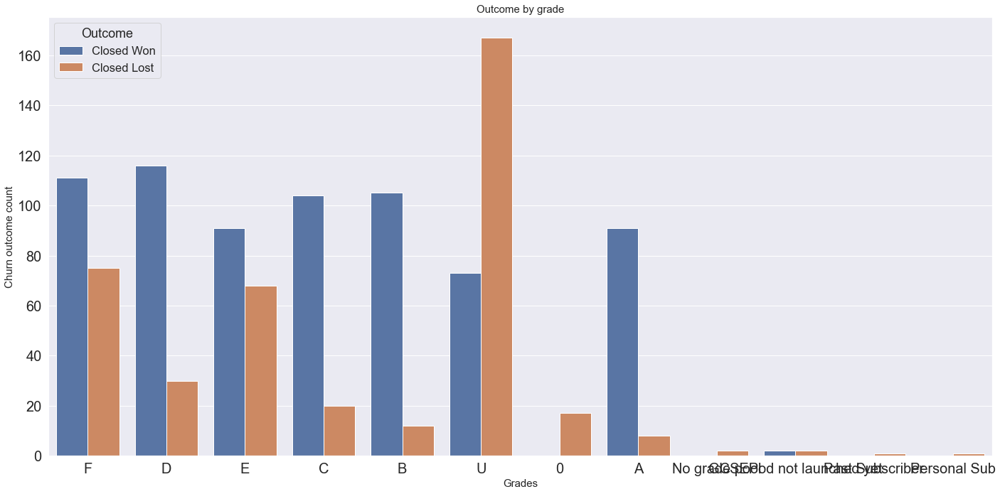

In [327]:
#Churn by grade
plt.figure(figsize=(20,10))
#sns.set(font_scale=1.5)
c = sns.countplot(x="Grade", hue="Outcome", data=df_last_3)
c.axes.set_title("Outcome by grade",fontsize=15)
c.set_xlabel("Grades",fontsize=15)
c.set_ylabel("Churn outcome count",fontsize=15)
c.tick_params(labelsize=20)
plt.legend(title='Outcome')
plt.tight_layout()
#sns.set(font_scale=1.5)
# g = sns.countplot(data=df_last_3, x='Grade', hue='Outcome', ax=ax)
# plt.tight_layout()

In [291]:
import matplotlib.pyplot as plt
#df_last_3['Grade'].value_counts(normalize=False).plot(kind='bar', figsize=(10, 5), fontsize=(10))



ValueError: Index contains duplicate entries, cannot reshape

In [ ]:
df.dtypes

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7fee8ac85150>,
      dtype=object)

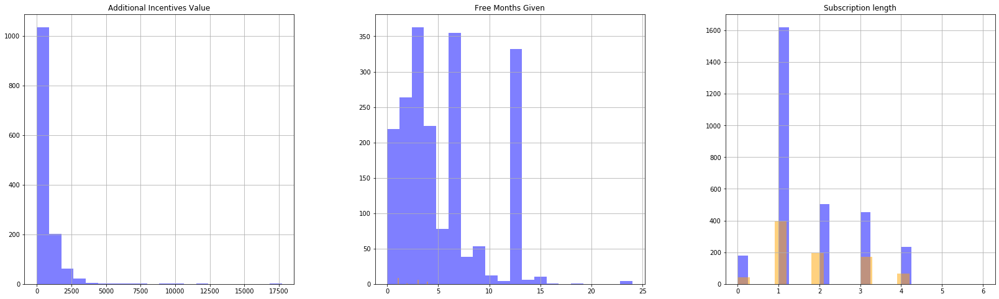

In [13]:
#Churn by numerical features
numerical_features = ['Free Months Given', 'Additional Incentives Value', 'Subscription length']
fig, ax = plt.subplots(1, 3, figsize=(28, 8))
df[df.Outcome == 'Closed Won'][numerical_features].hist(bins=20, color="blue", alpha=0.5, ax=ax)
df[df.Outcome == 'Closed Lost'][numerical_features].hist(bins=20, color="orange", alpha=0.5, ax=ax)


In [14]:
df.groupby('Subscription length')['Outcome'].value_counts()


Subscription length  Outcome    
0.0                  Closed Won      181
                     Closed Lost      43
1.0                  Closed Won     1621
                     Closed Lost     393
2.0                  Closed Won      506
                     Closed Lost     196
3.0                  Closed Won      454
                     Closed Lost     171
4.0                  Closed Won      236
                     Closed Lost      64
5.0                  Closed Won        1
6.0                  Closed Lost       1
Name: Outcome, dtype: int64

In [15]:
df["Price Based on This Number of Students"].fillna("Not given", inplace=True)
df_now = df_now.drop(columns={"Start Date of Order", "End Date of Order", "Previous End Date of Service"})
df_future = df_future.drop(columns={"Start Date of Order", "End Date of Order", "Previous End Date of Service"})
df_now.fillna("Not given", inplace=True)
df_future.fillna("Not given", inplace=True)


In [16]:
#Encode all non numerical values to numerical

from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()
objList = df_now.select_dtypes(include = "object").columns
objList_future = df_future.select_dtypes(include = "object").columns
#print (objList)
for feat in objList:
    df_now[feat] = le.fit_transform(df_now[feat].astype(str))

for feat in objList_future:
    df_future[feat] = le.fit_transform(df_future[feat].astype(str))
#print(df_now.info())
print(df_future.info())

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1223 entries, 8 to 5088
Data columns (total 21 columns):
 #   Column                                  Non-Null Count  Dtype  
---  ------                                  --------------  -----  
 0   Pyro Code                               1223 non-null   float64
 1   Account Name                            1223 non-null   int64  
 2   New or Renewal?                         1223 non-null   int64  
 3   Outcome                                 1223 non-null   int64  
 4   Subjects                                1223 non-null   int64  
 5   Previous Start Date of Service          1223 non-null   int64  
 6   Value of this Product                   1223 non-null   float64
 7   Additional Incentives                   1223 non-null   int64  
 8   Additional Incentives Value             1223 non-null   int64  
 9   Free Months Given                       1223 non-null   int64  
 10  Price Based on This Number of Students  1223 non-null   int6

In [ ]:
df_now.d()

In [17]:
#Scale the cleaned data
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report

X = df_now.drop('Outcome', axis = 1) 
y = df_now['Outcome']
X_future = df_future.drop('Outcome', axis = 1) 
y_future = df_future['Outcome']
#Standardizing/scaling the features
X = StandardScaler().fit_transform(X)
X_future = StandardScaler().fit_transform(X_future)

In [18]:
df_now.dtypes

Pyro Code                                 float64
Account Name                                int64
New or Renewal?                             int64
Outcome                                     int64
Subjects                                    int64
Previous Start Date of Service              int64
Value of this Product                       int64
Additional Incentives                       int64
Additional Incentives Value                 int64
Free Months Given                           int64
Price Based on This Number of Students      int64
Grade                                       int64
Upgrade, Downgrade, or Stayed the Same      int64
Check-up Category                           int64
Intervention Category                       int64
Closed Lost Reason                          int64
Project Manager                             int64
Sector                                      int64
Year Start                                float64
Year End                                    Int64


In [19]:
#Split the data into 80% training and 20% testing
x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [20]:
#Create the model
model = LogisticRegression()
#Train the model
model.fit(x_train, y_train)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [21]:
predictions = model.predict(x_test)
predictions_future = model.predict(X_future)

In [22]:
#Check precision, recall, f1-score
print(classification_report(y_test, predictions))
#print(classification_report(y_future, predictions_future))

              precision    recall  f1-score   support

           0       0.95      0.99      0.97       192
           1       1.00      0.98      0.99       582

    accuracy                           0.99       774
   macro avg       0.97      0.99      0.98       774
weighted avg       0.99      0.99      0.99       774



In [35]:
#df_future["Outcome"].value_counts()
# show the inputs and predicted outputs
for i in range(len(x_test)):
     print("X=%s, Predicted=%s" % ( x_test[i],predictions[i]))


X=[ 0.01177885  1.13342407 -1.06882284 -0.19650568  0.81745324 -0.83401389
 -2.50912232 -1.67632487  0.51762549  0.86625036  0.43458667 -0.08983758
  0.41857172  0.33334058  0.38965958  0.3065863  -0.91656435 -0.65053758
 -0.97118112 -0.64156938], Predicted=1
X=[-0.72757653  1.01277474 -1.06882284 -0.19650568  0.81745324  1.11372191
  0.37412007  0.47758267 -2.34433871 -0.96204881  0.43458667 -0.08983758
  0.41857172  0.33334058  0.38965958  0.3065863  -0.91656435 -0.23300583
  0.7630869   2.18089796], Predicted=1
X=[ 0.30042251  0.42616939 -1.06882284 -0.19650568  0.81745324  1.63014285
  0.37412007  0.47758267 -1.19955303  0.49406089  0.43458667 -0.08983758
  0.41857172  0.33334058 -0.98066927  0.3065863   1.2072024   0.60205768
  0.32951989 -0.64156938], Predicted=1
X=[-0.55225223 -1.25460056 -1.06882284 -0.19650568  0.81745324  0.53673307
  0.37412007  0.47758267 -0.8179578  -0.97510809  0.43458667 -0.08983758
  0.41857172  0.33334058  0.38965958  0.3065863  -0.91656435 -0.23300583

In [37]:
y_test.head(30)

2483    1
1601    1
2911    1
1794    1
1054    1
2008    0
1440    1
720     1
348     0
3722    1
1703    1
2350    0
4070    0
3095    1
2109    1
1638    1
2083    1
1417    1
32      0
1375    1
2502    1
4684    1
2247    1
2823    1
1846    0
12      0
454     0
2866    1
4981    0
2421    1
Name: Outcome, dtype: int64

In [ ]:
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from numpy import mean
from numpy import std

cv = KFold(n_splits=5, random_state=1, shuffle=True)
scores = cross_val_score(model, X, y, scoring='accuracy', cv=cv, n_jobs=-1)
# report performance

In [ ]:
print('Accuracy: %.3f (%.3f)' % (mean(scores), std(scores)))

##### SECOND ANALYSIS

In [77]:
df.head()

,Order Detail: ID,Pyro Code,Account Name,New or Renewal?,Outcome,Subjects,Start Date of Order,End Date of Order,Previous Start Date of Service,Previous End Date of Service,...,Additional Incentives Value,Free Months Given,Price Based on This Number of Students,Grade,"Upgrade, Downgrade, or Stayed the Same",Check-up Category,Intervention Category,Closed Lost Reason,Project Manager,Sector
0,a0O0J00000Visgh,1016.0,Bedford School,New,Closed Won,NaN,2010-04-30,2011-06-30,NaT,NaT,...,1250.00,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3. Independent
1,a0O0J00000Visu0,1016.0,Bedford School,Renewal,Closed Won,NaN,2011-07-01,2012-06-30,2010-04-30,2011-06-30,...,250.00,NaN,NaN,NaN,Downgrade,NaN,NaN,NaN,NaN,3. Independent
2,a0O0J00000Visuo,1016.0,Bedford School,Renewal,Closed Won,NaN,2012-08-01,2013-08-31,2011-01-07,2012-06-30,...,250.00,NaN,NaN,NaN,Downgrade,NaN,NaN,NaN,NaN,3. Independent
3,a0O0J00000WqCPm,1016.0,Bedford School,Renewal,Closed Won,NaN,2017-12-01,2019-11-30,2016-01-12,2017-11-30,...,57.08,NaN,290.0,F,Upgrade,AWAITING RENEWAL DISCUSSION,NEEDS PRIORITISATION (Medium or Low) - End,NaN,NaN,3. Independent
4,a0O0J00000VitZ8,1016.0,Bedford School,Renewal,Closed Won,NaN,2015-11-01,2016-11-30,2014-01-10,2015-10-31,...,650.00,1.0,280.0,NaN,Downgrade,NaN,NaN,NaN,NaN,3. Independent


<AxesSubplot:>

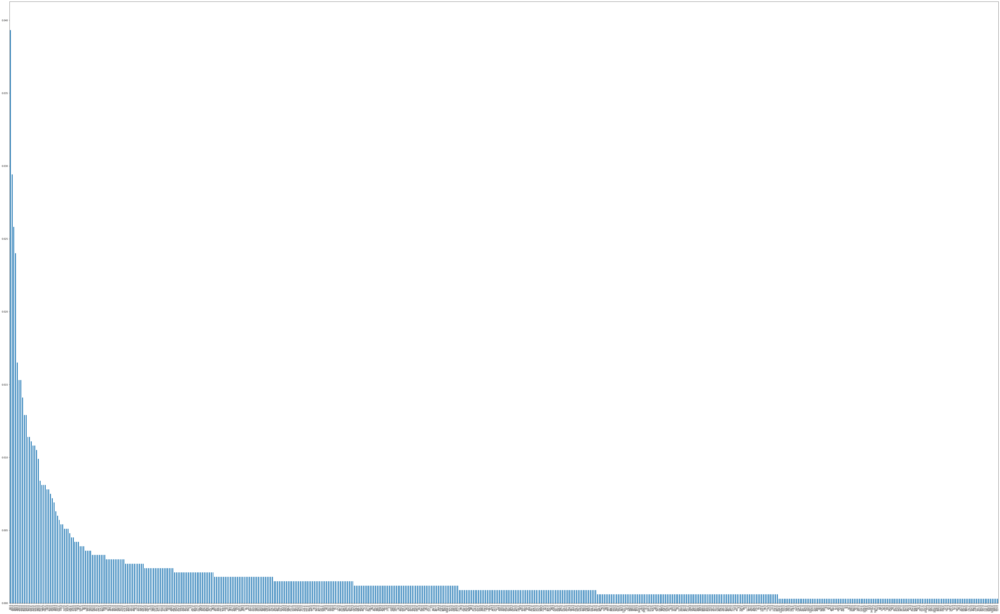

In [15]:
df['Price Based on This Number of Students'].value_counts(normalize = True).plot(kind="bar", figsize=(80, 50))

<AxesSubplot:>

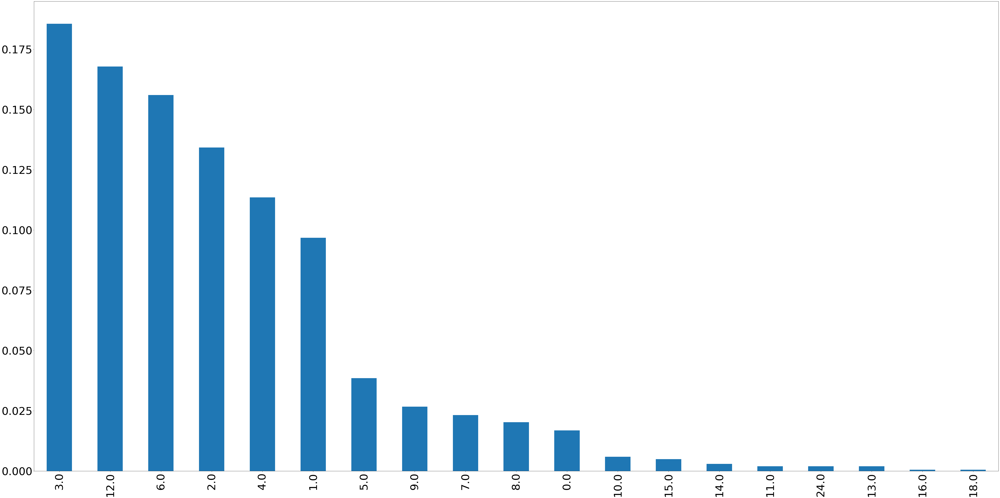

In [19]:
df['Free Months Given'].value_counts(normalize = True).plot(kind="bar", figsize=(80,40), fontsize=50)

In [21]:
#df['Additional Incentives Value'].value_counts(normalize = True).plot(kind="bar", figsize=(80,40), fontsize=50)

DO I care about filling Nans in these 3 cols with a None and keep the single values OR should I just substitute it with YES/NO? I will try both ways.

Hypothesis: YES/NO should be enough and prevent overfitting more since around 70% of values is none. Also, majority of grants are in the same range of values. 


In [201]:
#Replace all Nan values in additional incentives with 0 - as Nans means there are no incentives given
df['Additional Incentives Value'].fillna(value=0, inplace=True)
df['Free Months Given'].fillna(value=0, inplace=True)
df['Free Months Given']=df['Free Months Given'].astype('Int64')
df['Upgrade, Downgrade, or Stayed the Same'].fillna('Initial', inplace=True)
df['Check-up Category'].fillna('None', inplace=True)
df['Intervention Category'].fillna('None', inplace=True)
df['Closed Lost Reason'].fillna('None', inplace=True)
df['Subjects'].fillna('All', inplace=True)
df = df[df['Value of this Product'].notna()]

In [202]:
df["Year Start"] = df["Start Date of Order"].dt.year.fillna(df["Previous Start Date of Service"].dt.year)
df["Year End"] = df["End Date of Order"].dt.year.fillna(df["Previous End Date of Service"].dt.year)
df["Year Start"] = df["Year Start"].astype('Int64')
df["Year End"] = df["Year End"].astype('Int64')
df = df[df['Year End'].notna()]
df['Subscription Length'] = df['Year End'] - df['Year Start']

In [203]:
df.drop(columns={'Order Detail: ID', 'Start Date of Order', 'End Date of Order', 'Previous Start Date of Service', 'Previous End Date of Service'}, inplace=True)

In [204]:
df['Price Based on This Number of Students'].fillna(df['Price Based on This Number of Students'].mean(), inplace=True)
df['Price Based on This Number of Students'] = df['Price Based on This Number of Students'].astype(np.int64)

In [205]:
#Substituting num of students with an average from calculation
# actual_value = df['Value of this Product'] - df['Additional Incentives Value'] 
# subs_length = df['Year End'] - df['Year Start']
# missing_students = (actual_value/subs_length)/10

# for i, row in df.iterrows():
#     actual_value = row['Value of this Product'] - row['Additional Incentives Value'] 
#     subs_length = row['Year End'] - row['Year Start']
# #    print(row['Price Based on This Number of Students'])
#     if (pd.isnull(row['Price Based on This Number of Students'])):
#         #print(row)
#          row['Price Based on This Number of Students'] = (actual_value/subs_length)/10
# #     df.at[i,'ifor'] = ifor_val

In [206]:
df.head()

,Pyro Code,Account Name,New or Renewal?,Outcome,Subjects,Value of this Product,Additional Incentives,Additional Incentives Value,Free Months Given,Price Based on This Number of Students,Grade,"Upgrade, Downgrade, or Stayed the Same",Check-up Category,Intervention Category,Closed Lost Reason,Project Manager,Sector,Year Start,Year End,Subscription Length
0,1016.0,Bedford School,New,Closed Won,All,1250.0,Ad Hoc Discount,1250.00,2,297,NaN,Initial,None,None,None,NaN,3. Independent,2010,2011,1
1,1016.0,Bedford School,Renewal,Closed Won,All,1500.0,Ad Hoc Discount,250.00,0,297,NaN,Downgrade,None,None,None,NaN,3. Independent,2011,2012,1
2,1016.0,Bedford School,Renewal,Closed Won,All,1500.0,Ad Hoc Discount,250.00,0,297,NaN,Downgrade,None,None,None,NaN,3. Independent,2012,2013,1
3,1016.0,Bedford School,Renewal,Closed Won,All,5000.0,Ad Hoc Discount,57.08,0,290,F,Upgrade,AWAITING RENEWAL DISCUSSION,NEEDS PRIORITISATION (Medium or Low) - End,None,NaN,3. Independent,2017,2019,2
4,1016.0,Bedford School,Renewal,Closed Won,All,2150.0,Ad Hoc Discount,650.00,1,280,NaN,Downgrade,None,None,None,NaN,3. Independent,2015,2016,1


<AxesSubplot:>

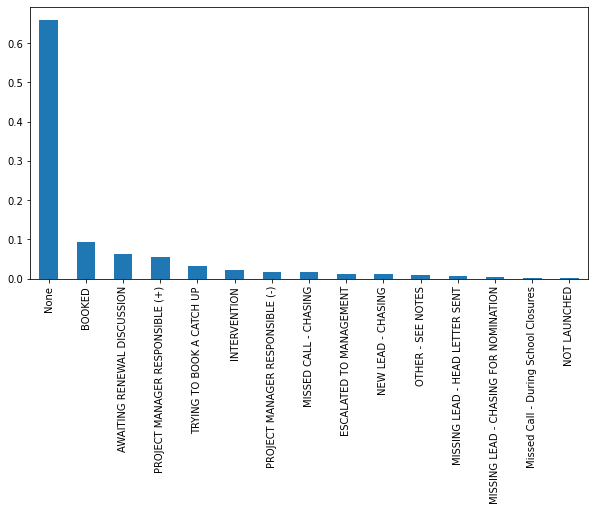

In [162]:
df['Check-up Category'].value_counts(normalize=True).plot(kind='bar', figsize=(10, 5), fontsize=(10))

<AxesSubplot:>

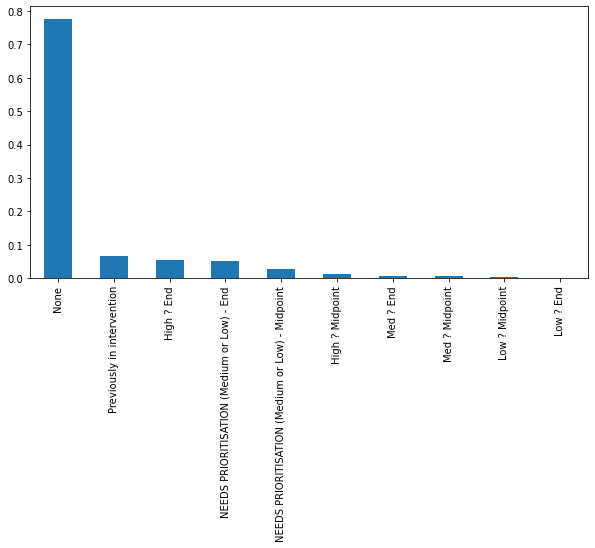

In [163]:
df['Intervention Category'].value_counts(normalize=True).plot(kind='bar', figsize=(10,5))

<AxesSubplot:>

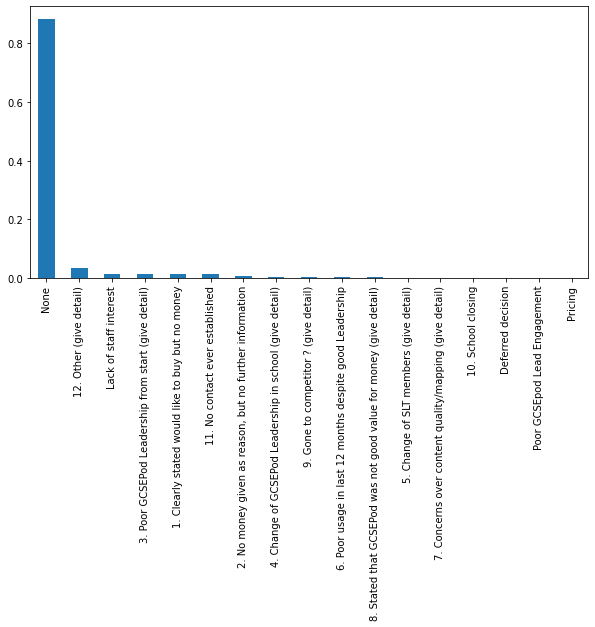

In [164]:
df['Closed Lost Reason'].value_counts(normalize=True).plot(kind='bar', figsize=(10,5))

In [191]:
df.isna().sum()

Pyro Code                                  310
Account Name                                 0
New or Renewal?                              0
Outcome                                      0
Subjects                                     0
Value of this Product                        0
Additional Incentives                     3892
Additional Incentives Value                  0
Free Months Given                            0
Price Based on This Number of Students       0
Grade                                     3459
Upgrade, Downgrade, or Stayed the Same       0
Check-up Category                            0
Intervention Category                        0
Closed Lost Reason                           0
Project Manager                           4258
Sector                                       0
Year Start                                   0
Year End                                     0
Subscription Length                          0
dtype: int64

In [207]:
df.drop(columns={'Project Manager'}, inplace=True)

In [208]:
#Incentives replace 1 of there is an incentive or 0 if no incentive
df['Additional Incentives'].fillna('None', inplace=True)
df['Additional Incentives'] = df['Additional Incentives'].apply(lambda x: 0 if x =='None' else 1)


In [209]:
df.head(15)

,Pyro Code,Account Name,New or Renewal?,Outcome,Subjects,Value of this Product,Additional Incentives,Additional Incentives Value,Free Months Given,Price Based on This Number of Students,Grade,"Upgrade, Downgrade, or Stayed the Same",Check-up Category,Intervention Category,Closed Lost Reason,Sector,Year Start,Year End,Subscription Length
0,1016.0,Bedford School,New,Closed Won,All,1250.00,1,1250.00,2,297,NaN,Initial,None,None,None,3. Independent,2010,2011,1
1,1016.0,Bedford School,Renewal,Closed Won,All,1500.00,1,250.00,0,297,NaN,Downgrade,None,None,None,3. Independent,2011,2012,1
2,1016.0,Bedford School,Renewal,Closed Won,All,1500.00,1,250.00,0,297,NaN,Downgrade,None,None,None,3. Independent,2012,2013,1
3,1016.0,Bedford School,Renewal,Closed Won,All,5000.00,1,57.08,0,290,F,Upgrade,AWAITING RENEWAL DISCUSSION,NEEDS PRIORITISATION (Medium or Low) - End,None,3. Independent,2017,2019,2
4,1016.0,Bedford School,Renewal,Closed Won,All,2150.00,1,650.00,1,280,NaN,Downgrade,None,None,None,3. Independent,2015,2016,1
5,1016.0,Bedford School,Renewal,Closed Won,All,2660.00,0,0.00,0,280,F,Downgrade,PROJECT MANAGER RESPONSIBLE (-),Previously in intervention,None,3. Independent,2016,2017,1
6,1016.0,Bedford School,Renewal,Closed Won,All,2150.00,1,559.00,0,297,NaN,Downgrade,None,None,None,3. Independent,2013,2014,1
7,1016.0,Bedford School,Renewal,Closed Won,All,2150.00,1,567.00,0,280,NaN,Downgrade,None,None,None,3. Independent,2014,2015,1
8,1016.0,Bedford School,Renewal,Closed Won,All,5000.00,1,781.51,0,294,E,Upgrade,PROJECT MANAGER RESPONSIBLE (-),Previously in intervention,None,3. Independent,2019,2021,2
9,1023.0,Essa Academy,New,Closed Won,All,2000.70,1,1077.30,3,297,NaN,Initial,None,None,None,1. Academy,2013,2014,1


In [221]:
import sklearn
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.metrics import roc_auc_score
from sklearn.preprocessing import StandardScaler

In [222]:
df.isna().sum()

Pyro Code                                 0
Account Name                              0
New or Renewal?                           0
Outcome                                   0
Subjects                                  0
Value of this Product                     0
Additional Incentives                     0
Additional Incentives Value               0
Free Months Given                         0
Price Based on This Number of Students    0
Grade                                     0
Upgrade, Downgrade, or Stayed the Same    0
Check-up Category                         0
Intervention Category                     0
Closed Lost Reason                        0
Sector                                    0
Year Start                                0
Year End                                  0
Subscription Length                       0
dtype: int64

In [224]:
df = df[df['Pyro Code'].notna()]
df.drop(columns={'Account Name'}, inplace=True)

In [216]:
df['Grade'].fillna('Z', inplace=True)

/Users/lucrezialamanna/anaconda3/lib/python3.7/site-packages/pandas/core/generic.py:6245: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._update_inplace(new_data)


In [231]:
features = df.drop('Outcome', axis = 1) 
result = df['Outcome']

In [232]:
le = LabelEncoder()
objList = df.select_dtypes(include = "object").columns

for feat in objList:
    df[feat] = le.fit_transform(df[feat].astype(str))


#print(df_now.info())
print(df.info())

features = StandardScaler().fit_transform(features)

X_train, X_test, y_train, y_test = train_test_split(features, result, test_size = 0.2, random_state = 14)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5089 entries, 0 to 5090
Data columns (total 18 columns):
 #   Column                                  Non-Null Count  Dtype  
---  ------                                  --------------  -----  
 0   Pyro Code                               5089 non-null   float64
 1   New or Renewal?                         5089 non-null   int64  
 2   Outcome                                 5089 non-null   int64  
 3   Subjects                                5089 non-null   int64  
 4   Value of this Product                   5089 non-null   float64
 5   Additional Incentives                   5089 non-null   int64  
 6   Additional Incentives Value             5089 non-null   float64
 7   Free Months Given                       5089 non-null   Int64  
 8   Price Based on This Number of Students  5089 non-null   int64  
 9   Grade                                   5089 non-null   int64  
 10  Upgrade, Downgrade, or Stayed the Same  5089 non-null   int6

In [233]:
rf = RandomForestClassifier()
rf.fit(X_train, y_train)
# Making predictions on unseen data
predictions_rf = rf.predict(X_test)

AttributeError: 'numpy.ndarray' object has no attribute 'columns'

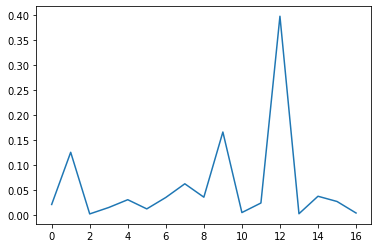

In [234]:
# what features are the most important?
plt.plot(rf.feature_importances_)
plt.xticks(np.arange(X_train.shape[1]), X_train.columns.tolist(), rotation=90)

In [235]:
list(zip(features, rf.feature_importances_))

[(array([-1.44988384, -1.05599661, -0.1992328 , -0.94309808,  1.58878514,
          1.7861253 , -0.02336854, -0.01554519,  0.67340441, -0.18591047,
          0.42898803,  0.32322891,  0.33398981,  1.21702844, -2.43559621,
         -2.61167198, -0.76056368]),
  0.020901951830435105),
 (array([-1.44988384,  0.94697274, -0.1992328 , -0.85820597,  1.58878514,
          0.12275136, -0.58698226, -0.01554519,  0.67340441, -1.2733799 ,
          0.42898803,  0.32322891,  0.33398981,  1.21702844, -2.05584349,
         -2.25419064, -0.76056368]),
  0.12519474450762139),
 (array([-1.44988384,  0.94697274, -0.1992328 , -0.85820597,  1.58878514,
          0.12275136, -0.58698226, -0.01554519,  0.67340441, -1.2733799 ,
          0.42898803,  0.32322891,  0.33398981,  1.21702844, -1.67609077,
         -1.8967093 , -0.76056368]),
  0.0020367780101380253),
 (array([-1.44988384,  0.94697274, -0.1992328 ,  0.33028357,  1.58878514,
         -0.19814674, -0.58698226, -0.06156964, -0.80873573,  1.98902838,


In [236]:
print(classification_report(y_test, predictions_rf))
print(confusion_matrix(y_test, predictions_rf))
# Under ROC curve
prob_rf = rf.predict_proba(X_test)
prob_rf = [p[1] for p in prob_rf]
print(roc_auc_score(y_test, prob_rf))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       169
           1       1.00      1.00      1.00       849

    accuracy                           1.00      1018
   macro avg       1.00      1.00      1.00      1018
weighted avg       1.00      1.00      1.00      1018

[[169   0]
 [  0 849]]
1.0


In [237]:
#Create the model
model = LogisticRegression()
#Train the model
model.fit(X_train, y_train)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [240]:
predictions = model.predict(X_test)

In [241]:
print(classification_report(y_test, predictions))

              precision    recall  f1-score   support

           0       0.91      0.89      0.90       169
           1       0.98      0.98      0.98       849

    accuracy                           0.97      1018
   macro avg       0.95      0.94      0.94      1018
weighted avg       0.97      0.97      0.97      1018



In [328]:
df.columns

Index(['Order Detail: ID', 'Pyro Code', 'Account Name', 'New or Renewal?',
       'Outcome', 'Subjects', 'Start Date of Order', 'End Date of Order',
       'Previous Start Date of Service', 'Previous End Date of Service',
       'Value of this Product', 'Additional Incentives',
       'Additional Incentives Value', 'Free Months Given',
       'Price Based on This Number of Students', 'Grade',
       'Upgrade, Downgrade, or Stayed the Same', 'Check-up Category',
       'Intervention Category', 'Closed Lost Reason', 'Project Manager',
       'Sector', 'Year Start', 'Year End'],
      dtype='object')